In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import os  #case connect via OS
os.chdir("/content/gdrive/")
os.getcwd()
path = "/content/gdrive/MyDrive/Colab Notebooks/ai/Tires_Dataset_For_You_Bro"
files = os.listdir(path)
print(os.listdir(path))

['validation', 'test', 'train', '.ipynb_checkpoints']


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

In [ ]:
BATCH_SIZE = 32
IMG_SIZE = (180, 180)

train_dataset = tf.keras.utils.image_dataset_from_directory(path+'/train',
                                                            shuffle=True,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE)

validation_dataset = tf.keras.utils.image_dataset_from_directory(path+'/validation',
                                                                 shuffle=True,
                                                                 batch_size=BATCH_SIZE,
                                                                 image_size=IMG_SIZE)

test_dataset = tf.keras.utils.image_dataset_from_directory(path+'/test',
                                                            shuffle=True,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE)

Found 1400 files belonging to 2 classes.
Found 300 files belonging to 2 classes.
Found 300 files belonging to 2 classes.


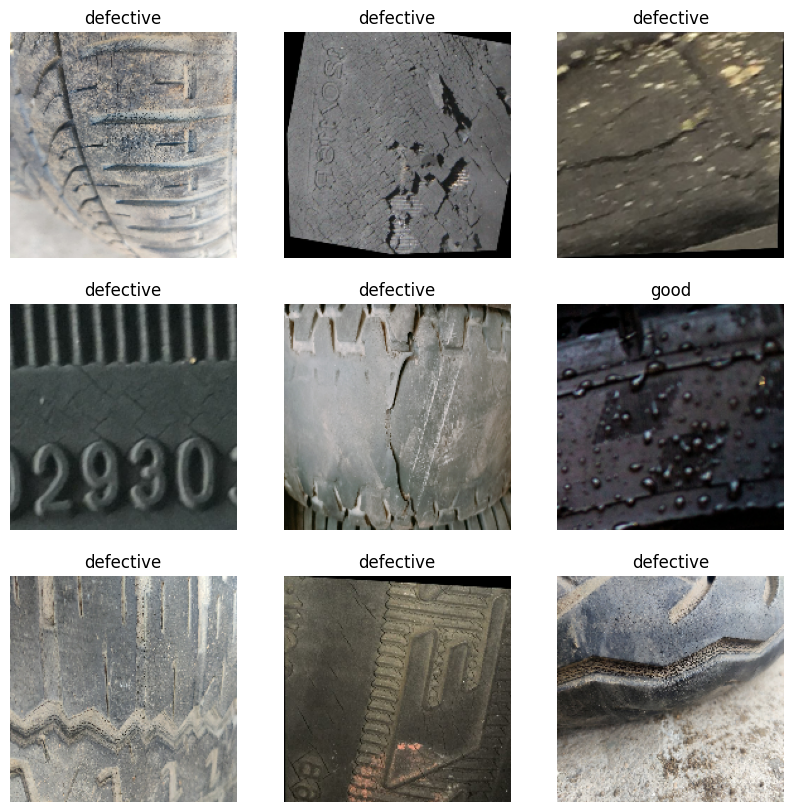

In [ ]:
class_names = train_dataset.class_names

plt.figure(figsize=(10, 10))
for images, labels in train_dataset.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.prefetch(buffer_size=AUTOTUNE)
test_dataset = test_dataset.prefetch(buffer_size=AUTOTUNE)

In [ ]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip('horizontal'),
  tf.keras.layers.RandomRotation(0.2),
])

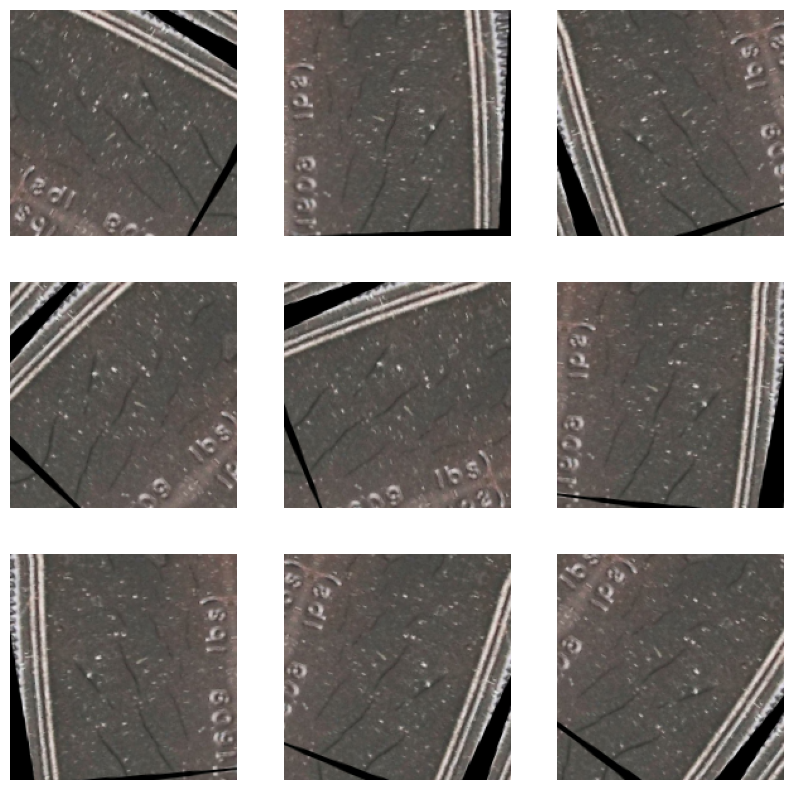

In [ ]:
for image, _ in train_dataset.take(1):
  plt.figure(figsize=(10, 10))
  first_image = image[0]
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
    plt.imshow(augmented_image[0] / 255)
    plt.axis('off')

In [ ]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

In [ ]:
rescale = tf.keras.layers.Rescaling(1./127.5, offset=-1)

In [ ]:
# Create the base model from the pre-trained model MobileNet V2
IMG_SHAPE = IMG_SIZE + (3,)
base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')

<ipython-input-11-166d6a4a06f6>:3: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
image_batch, label_batch = next(iter(train_dataset))
feature_batch = base_model(image_batch)
print(feature_batch.shape)

(32, 6, 6, 1280)


In [ ]:
base_model.trainable = False
base_model.summary()

Model: "mobilenetv2_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 180, 180, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 90, 90, 32)     │            864 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 90, 90, 32)     │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 90, 90, 32)     │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 90, 90, 32)     │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 90, 90, 32)     │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 90, 90, 32)     │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 90, 90, 16)     │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 90, 90, 16)     │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 90, 90, 96)     │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 90, 90, 96)     │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 90, 90, 96)     │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 91, 91, 96)     │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 45, 45, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├──────────────────────

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 1280)


In [ ]:
prediction_layer = tf.keras.layers.Dense(1, activation='sigmoid', kernel_regularizer=tf.keras.regularizers.l2(0.01))
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 1)


In [ ]:
inputs = tf.keras.Input(shape=(180, 180, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.5)(x)
outputs = prediction_layer(x)
model = tf.keras.Model(inputs, outputs)

In [ ]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 180, 180, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential (Sequential)              │ (None, 180, 180, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ true_divide (TrueDivide)             │ (None, 180, 180, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ subtract (Subtract)                  │ (None, 180, 180, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 6, 6, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │           1,281 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,259,265 (8.62 MB)

 Trainable params: 1,281 (5.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
len(model.trainable_variables)

47

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
from tensorflow.keras.callbacks import ReduceLROnPlateau

# Reduce learning rate when a metric has stopped improving
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6, verbose=1)
model.compile(optimizer=tf.keras.optimizers.Adam(),
              loss=tf.keras.losses.BinaryCrossentropy(),
              metrics=[tf.keras.metrics.BinaryAccuracy(threshold=0.5, name='accuracy')])

In [ ]:
loss0, accuracy0 = model.evaluate(validation_dataset)

10/10 ━━━━━━━━━━━━━━━━━━━━ 118s 11s/step - accuracy: 0.5191 - loss: 0.8382


In [ ]:
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

initial loss: 0.85
initial accuracy: 0.52


In [ ]:
initial_epochs = 20
history3 = model.fit(train_dataset,
                    epochs=initial_epochs,
                    validation_data=validation_dataset,
                    callbacks=[early_stopping]
                    )

Epoch 1/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 177s 4s/step - accuracy: 0.4737 - loss: 1.1645 - val_accuracy: 0.5700 - val_loss: 0.7414
Epoch 2/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 90s 2s/step - accuracy: 0.5142 - loss: 0.9561 - val_accuracy: 0.6667 - val_loss: 0.6270
Epoch 3/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 140s 2s/step - accuracy: 0.5565 - loss: 0.8610 - val_accuracy: 0.7100 - val_loss: 0.5605
Epoch 4/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 88s 2s/step - accuracy: 0.6552 - loss: 0.7115 - val_accuracy: 0.7867 - val_loss: 0.4967
Epoch 5/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 143s 2s/step - accuracy: 0.6872 - loss: 0.6573 - val_accuracy: 0.8233 - val_loss: 0.4571
Epoch 6/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 145s 2s/step - accuracy: 0.7043 - loss: 0.6188 - val_accuracy: 0.8533 - val_loss: 0.4264
Epoch 7/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 137s 2s/step - accuracy: 0.7271 - loss: 0.5799 - val_accuracy: 0.8633 - val_loss: 0.4099
Epoch 8/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 142s 2s/step - accuracy: 0.7791 - loss: 0.5158 - val_accuracy: 0.8600 - val

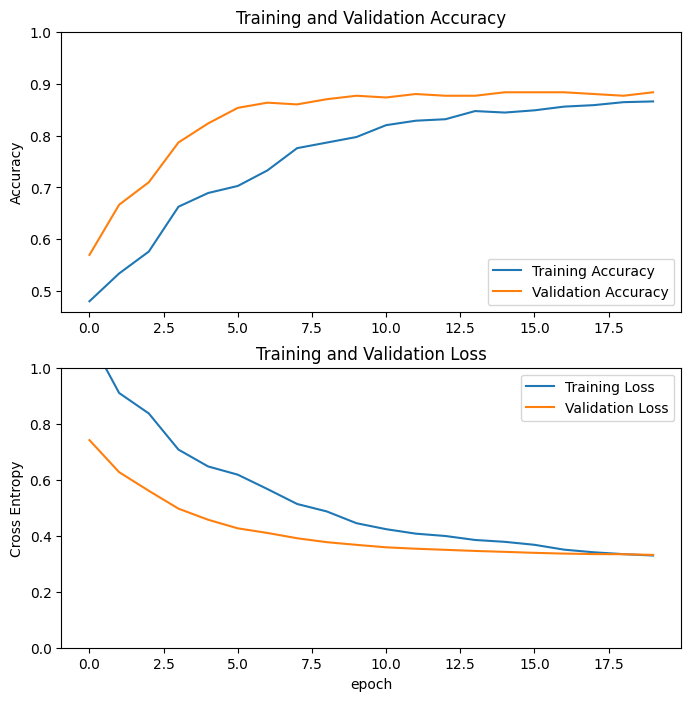

In [ ]:
acc = history3.history['accuracy']
val_acc = history3.history['val_accuracy']

loss = history3.history['loss']
val_loss = history3.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
loss, accuracy = model.evaluate(test_dataset)
print('Test accuracy :', accuracy)

10/10 ━━━━━━━━━━━━━━━━━━━━ 113s 11s/step - accuracy: 0.7978 - loss: 0.4733
Test accuracy : 0.8066666722297668


In [ ]:
model.save_weights("/content/gdrive/MyDrive/Colab Notebooks/model/tire1s.weights.h5")
# Changed the filename to end with `.weights.h5` to meet the requirement of the function.

In [ ]:
model_arch_path = "/content/gdrive/MyDrive/Colab Notebooks/model/tire1s.json"

# Create the directory if it doesn't exist:
os.makedirs(os.path.dirname(model_arch_path), exist_ok=True)

model_json = model.to_json()
with open(model_arch_path, "w") as json_file:
    json_file.write(model_json)

Predictions (Probabilities):
 [0.87375665 0.07102141 0.49013263 0.47528112 0.07488104 0.9464539
 0.11372458 0.28343484 0.9293783  0.34681147 0.9695053  0.36622515
 0.01384332 0.12215722 0.04560181 0.2555221  0.05512287 0.27658665
 0.5546207  0.91891676 0.8516589  0.33430767 0.8713073  0.0624871
 0.99773145 0.5047406  0.8661157  0.13142835 0.97655076 0.35093537
 0.07507823 0.04202976]
Labels:
 [1 0 1 1 0 1 0 0 1 0 1 1 0 1 0 1 0 0 0 1 1 0 1 0 1 0 1 0 1 0 0 0]


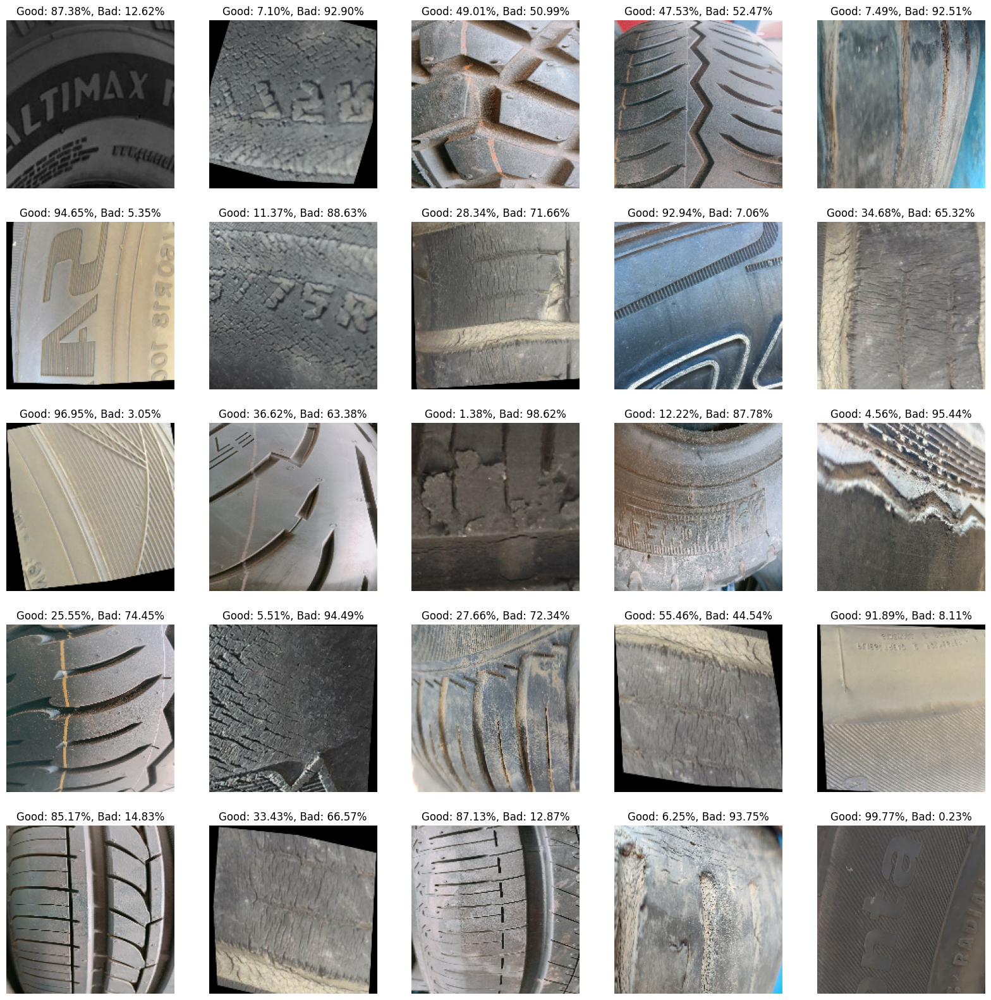

In [ ]:
# Retrieve a batch of images from the test set
image_batch, label_batch = test_dataset.as_numpy_iterator().next()

# Get predictions as probabilities
predictions = model.predict_on_batch(image_batch).flatten()

# Convert probabilities to percentages
confidence_good = predictions * 100  # Confidence for the "good" class (positive class)
confidence_bad = (1 - predictions) * 100  # Confidence for the "bad" class (negative class)

print('Predictions (Probabilities):\n', predictions)
print('Labels:\n', label_batch)

# Display the images with predicted class and both confidence percentages
plt.figure(figsize=(20, 20))
for i in range(25):
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(image_batch[i].astype("uint8"))

    # Get the class names and confidence values for display
    good_conf = confidence_good[i]
    bad_conf = confidence_bad[i]
    plt.title(f"Good: {good_conf:.2f}%, Bad: {bad_conf:.2f}%")
    plt.axis("off")

plt.show()


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Confusion Matrix:
[[150   0]
 [ 36 114]]
Classification Report:
              precision    recall  f1-score   support

   defective       0.81      1.00      0.89       150
        good       1.00      0.76      0.86       150

    accuracy                           0.88       300
   macro avg       0.90      0.88      0.88       300
weighted avg       0.90      0.88      0.88       300



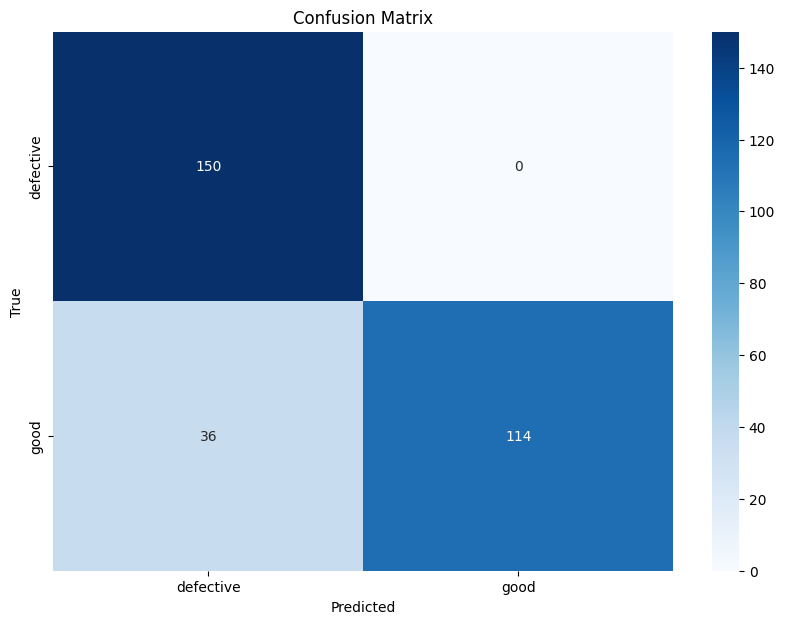

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming test_set is your ImageDataGenerator test generator
X_test, y_test = [], []

# Convert the _PrefetchDataset to an iterator
test_dataset_iterator = iter(test_dataset)

# Iterate over the generator to get all batches of data
for _ in range(len(test_dataset)):
    # Get the next batch of images and labels
    x_batch, y_batch = next(test_dataset_iterator) # Use the iterator here
    X_test.append(x_batch)
    y_test.append(y_batch)

# Concatenate all batches into a single numpy array
X_test = np.concatenate(X_test)
y_test = np.concatenate(y_test)

# Assuming you have a fixed test set: X_test (features) and y_test (true labels)
# Step 1: Predict the labels on the test set
y_pred = model.predict(X_test)  # Predict directly using your fixed test set
y_pred_classes = (y_pred > 0.5).astype("int32")  # Binary classification

# Step 2: Use y_test directly if it's already in the correct format
# If y_test is not binary, ensure to convert it to binary format
y_true = y_test  # Ensure this gets the correct true labels

# Step 3: Compute the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Step 4: Print the confusion matrix
print("Confusion Matrix:")
print(cm)

report = classification_report(y_true, y_pred_classes, target_names=class_names) # Use the class_names list directly
print("Classification Report:")
print(report)


# Step 6: Plot the confusion matrix using seaborn
plt.figure(figsize=(10,7))
#class_names = list(train_dataset.class_indices.keys()) # Replace 'train_dataset' with the correct name of your ImageDataGenerator object
# Instead of extracting the class names again, use the existing 'class_names' variable
# This assumes that the 'class_names' variable in your global scope contains the correct class names
class_names = ['defective', 'good']
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
base_model.trainable = True
# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(base_model.layers))

# Fine-tune from this layer onwards
fine_tune_at = 110

# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable = False

Number of layers in the base model:  154


In [ ]:
model.compile(loss=tf.keras.losses.BinaryCrossentropy(),
              optimizer = tf.keras.optimizers.Adam(),
              metrics=[tf.keras.metrics.BinaryAccuracy(threshold=0.5, name='accuracy')])

In [ ]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 180, 180, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential (Sequential)              │ (None, 180, 180, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ true_divide (TrueDivide)             │ (None, 180, 180, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ subtract (Subtract)                  │ (None, 180, 180, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 6, 6, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │           1,281 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,259,265 (8.62 MB)

 Trainable params: 1,744,449 (6.65 MB)

 Non-trainable params: 514,816 (1.96 MB)

In [ ]:
len(model.trainable_variables)

47

In [ ]:
fine_tune_epochs = 10

history_fine2 = model.fit(train_dataset,
                         epochs=total_epochs,
                         validation_data=validation_dataset)

Epoch 1/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 394s 9s/step - accuracy: 0.8750 - loss: 0.3084 - val_accuracy: 0.8733 - val_loss: 0.3348
Epoch 2/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 164s 2s/step - accuracy: 0.9428 - loss: 0.1760 - val_accuracy: 0.8900 - val_loss: 0.3620
Epoch 3/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 137s 2s/step - accuracy: 0.9771 - loss: 0.0878 - val_accuracy: 0.8633 - val_loss: 0.4460
Epoch 4/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 143s 2s/step - accuracy: 0.9784 - loss: 0.0774 - val_accuracy: 0.8900 - val_loss: 0.3983
Epoch 5/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 146s 2s/step - accuracy: 0.9912 - loss: 0.0506 - val_accuracy: 0.8900 - val_loss: 0.4847
Epoch 6/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 110s 2s/step - accuracy: 0.9907 - loss: 0.0493 - val_accuracy: 0.8900 - val_loss: 0.4468
Epoch 7/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 135s 2s/step - accuracy: 0.9885 - loss: 0.0534 - val_accuracy: 0.8867 - val_loss: 0.4231
Epoch 8/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 141s 2s/step - accuracy: 0.9886 - loss: 0.0473 - val_accuracy: 0.8933 - v

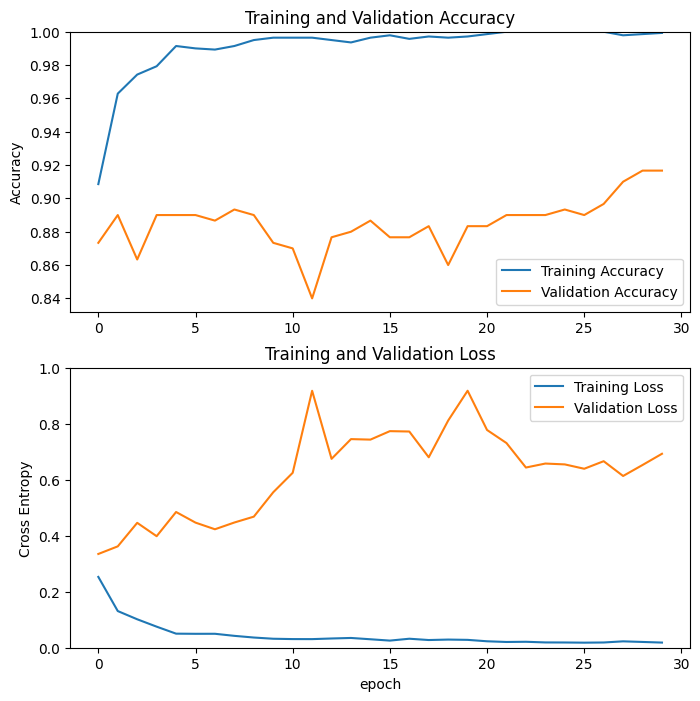

In [ ]:
acc = history_fine2.history['accuracy']
val_acc = history_fine2.history['val_accuracy']

loss = history_fine2.history['loss']
val_loss = history_fine2.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
loss, accuracy = model.evaluate(test_dataset)
print('Test accuracy :', accuracy)

10/10 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.8807 - loss: 0.3172
Test accuracy : 0.8799999952316284


Predictions (Probabilities):
 [1.7838016e-02 3.1169820e-05 4.5945373e-05 5.2878837e-04 9.9968123e-01
 8.9339644e-01 6.3627446e-04 6.5206455e-05 1.7961526e-04 9.7241068e-01
 2.9348785e-03 5.2878837e-04 2.5823832e-05 5.3216736e-05 9.9504405e-01
 5.6518787e-01 1.4067143e-04 9.2620790e-02 1.1597615e-05 9.6346897e-01
 9.9738032e-01 9.8603237e-01 9.4766480e-01 9.9998534e-01 9.9990296e-01
 9.9913299e-01 1.2559653e-02 1.6094967e-04 1.1237976e-02 4.3049664e-04
 9.9994379e-01 9.9765044e-01]
Labels:
 [1 0 0 0 1 1 0 0 0 1 0 0 0 0 1 1 0 0 0 1 1 1 1 1 1 1 0 0 0 0 1 1]


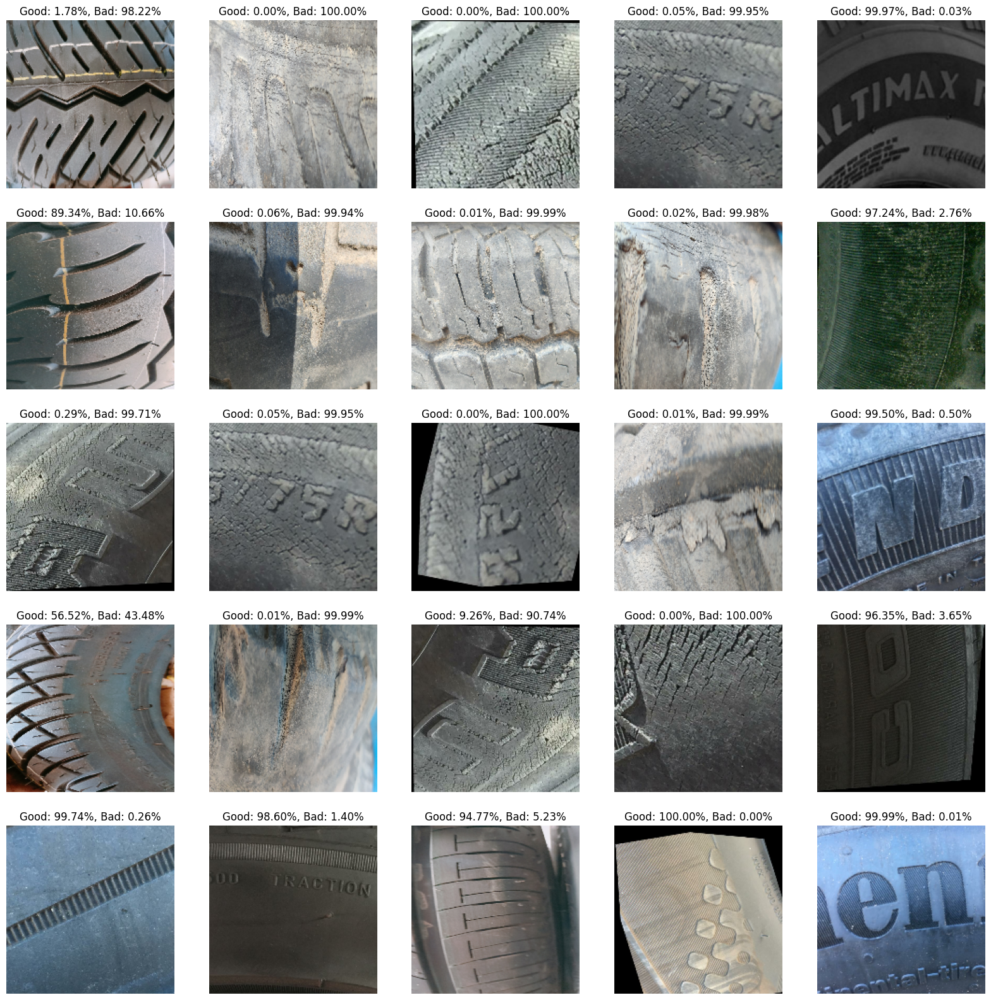

In [ ]:
# Retrieve a batch of images from the test set
image_batch, label_batch = test_dataset.as_numpy_iterator().next()

# Get predictions as probabilities
predictions = model.predict_on_batch(image_batch).flatten()

# Convert probabilities to percentages
confidence_good = predictions * 100  # Confidence for the "good" class (positive class)
confidence_bad = (1 - predictions) * 100  # Confidence for the "bad" class (negative class)

print('Predictions (Probabilities):\n', predictions)
print('Labels:\n', label_batch)

# Display the images with predicted class and both confidence percentages
plt.figure(figsize=(20, 20))
for i in range(25):
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(image_batch[i].astype("uint8"))

    # Get the class names and confidence values for display
    good_conf = confidence_good[i]
    bad_conf = confidence_bad[i]
    plt.title(f"Good: {good_conf:.2f}%, Bad: {bad_conf:.2f}%")
    plt.axis("off")

plt.show()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 973ms/step
Confusion Matrix:
[[144   6]
 [ 15 135]]


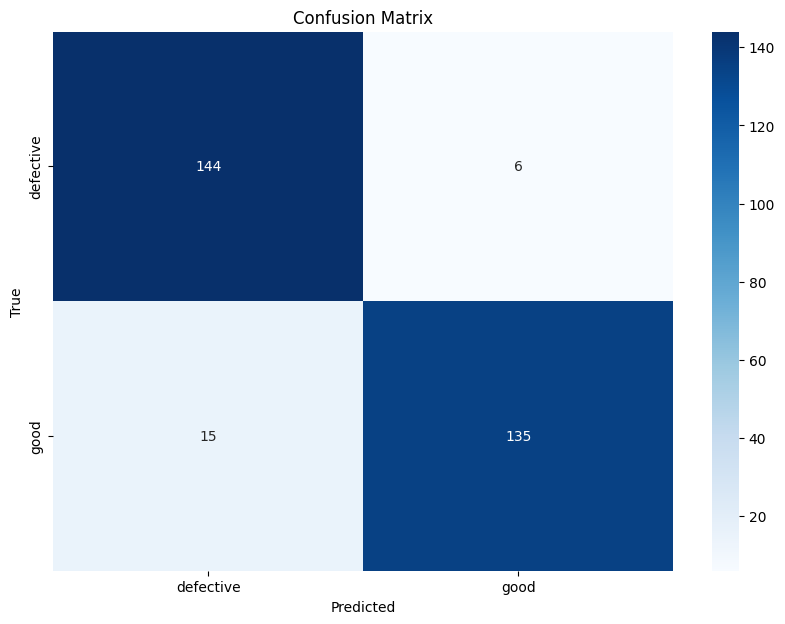

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming test_set is your ImageDataGenerator test generator
X_test, y_test = [], []

# Convert the _PrefetchDataset to an iterator
test_dataset_iterator = iter(test_dataset)

# Iterate over the generator to get all batches of data
for _ in range(len(test_dataset)):
    # Get the next batch of images and labels
    x_batch, y_batch = next(test_dataset_iterator) # Use the iterator here
    X_test.append(x_batch)
    y_test.append(y_batch)

# Concatenate all batches into a single numpy array
X_test = np.concatenate(X_test)
y_test = np.concatenate(y_test)

# Assuming you have a fixed test set: X_test (features) and y_test (true labels)
# Step 1: Predict the labels on the test set
y_pred = model.predict(X_test)  # Predict directly using your fixed test set
y_pred_classes = (y_pred > 0.5).astype("int32")  # Binary classification

# Step 2: Use y_test directly if it's already in the correct format
# If y_test is not binary, ensure to convert it to binary format
y_true = y_test  # Ensure this gets the correct true labels

# Step 3: Compute the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Step 4: Print the confusion matrix
print("Confusion Matrix:")
print(cm)



# Step 6: Plot the confusion matrix using seaborn
plt.figure(figsize=(10,7))
#class_names = list(train_dataset.class_indices.keys()) # Replace 'train_dataset' with the correct name of your ImageDataGenerator object
# Instead of extracting the class names again, use the existing 'class_names' variable
# This assumes that the 'class_names' variable in your global scope contains the correct class names
class_names = ['defective', 'good']
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
model.save_weights("/content/gdrive/MyDrive/Colab Notebooks/model/FINALtiresfinetune.weights.h5")
# Changed the filename to end with `.weights.h5` to meet the requirement of the function.

In [ ]:
model_arch_path = "/content/gdrive/MyDrive/Colab Notebooks/model/FINALmodel_tune.json"

# Create the directory if it doesn't exist:
os.makedirs(os.path.dirname(model_arch_path), exist_ok=True)

model_json = model.to_json()
with open(model_arch_path, "w") as json_file:
    json_file.write(model_json)